In [1]:
import os
import sys
import inspect

currentdir = os.path.dirname(os.path.abspath(inspect.getfile(inspect.currentframe())))
parentdir = os.path.dirname(currentdir)
sys.path.insert(0, parentdir) 
sys.path.insert(1, os.path.join(parentdir, 'data_utils')) 

from background_detection import detect_background
from hypercube_data import *
import config
import numpy as np
import matplotlib.pyplot as plt
import cv2
import os
import glob


paths from config ['/home/sc.uni-leipzig.de/mi186veva/hsi-experiments', '/home/sc.uni-leipzig.de/mi186veva/hsi-experiments/utils', '/home/sc.uni-leipzig.de/mi186veva/hsi-experiments/models', '/home/sc.uni-leipzig.de/mi186veva/hsi-experiments/data_utils', '/home/sc.uni-leipzig.de/mi186veva/hsi-experiments/data_utils', '/home/sc.uni-leipzig.de/mi186veva/hsi-experiments/jupyter', '', '/software/all/scikit-build/0.11.1-fosscuda-2020b/lib/python3.8/site-packages', '/software/all/OpenCV/4.5.1-foss-2020b-contrib/lib/python3.8/site-packages', '/software/all/scikit-image/0.18.1-foss-2020b/lib/python3.8/site-packages', '/software/all/dask/2021.2.0-foss-2020b/lib/python3.8/site-packages', '/software/all/bokeh/2.2.3-foss-2020b/lib/python3.8/site-packages', '/software/all/typing-extensions/3.7.4.3-GCCcore-10.2.0/lib/python3.8/site-packages', '/software/all/networkx/2.5-foss-2020b/lib/python3.8/site-packages', '/software/all/Pillow/8.0.1-GCCcore-10.2.0/lib/python3.8/site-packages', '/software/all/Tk

In [2]:
#data = np.load(path)
#X, y = data['X'], data['y']



preffix = '/work/users/mi186veva/data/'
path = '2019_08_28_14_00_34_SpecCube.dat'


paths = glob.glob(os.path.join(preffix, '*.dat'))




/work/users/mi186veva/data/2019_07_15_11_33_28_SpecCube.dat
(480, 640, 92)
(480, 640)
res.shape (307200,)
res.shape (480, 640)
(105819,) (201381,)


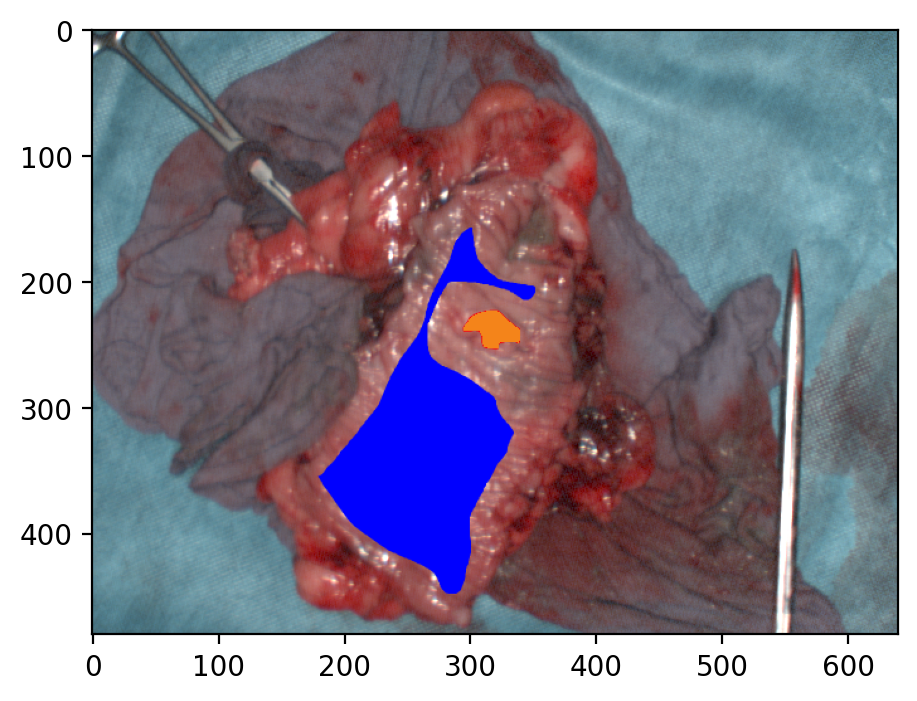

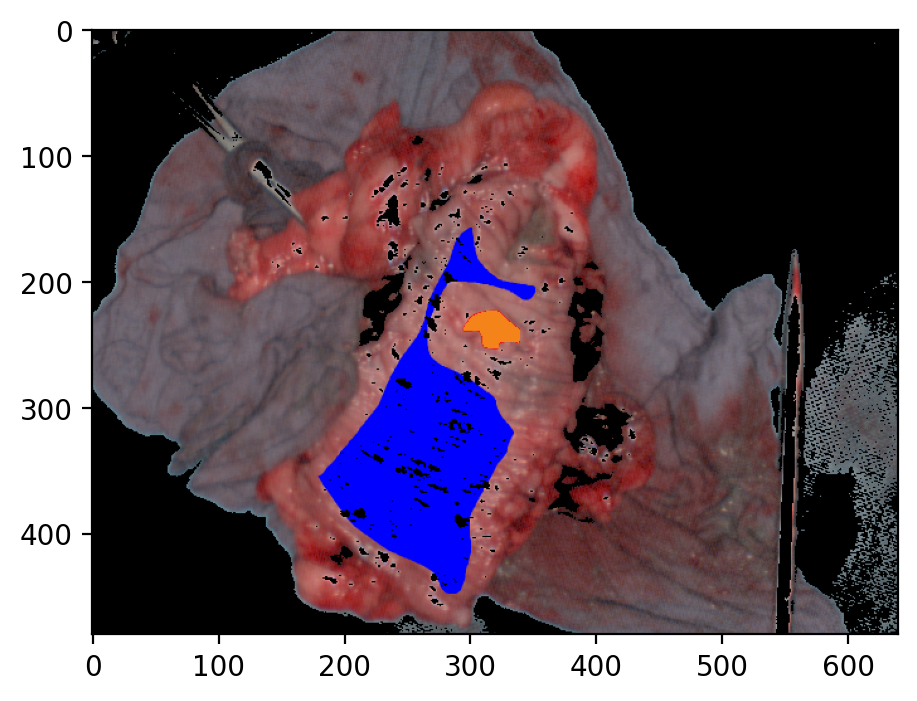

/work/users/mi186veva/data/2019_09_04_12_43_40_SpecCube.dat
(480, 640, 92)
(480, 640)
res.shape (307200,)
res.shape (480, 640)
(62258,) (244942,)


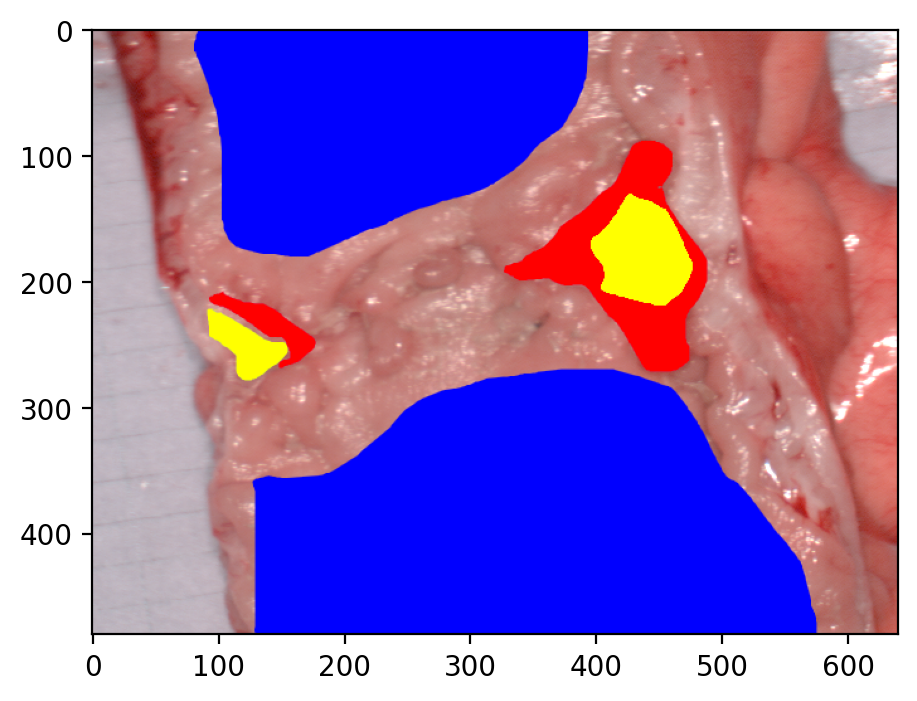

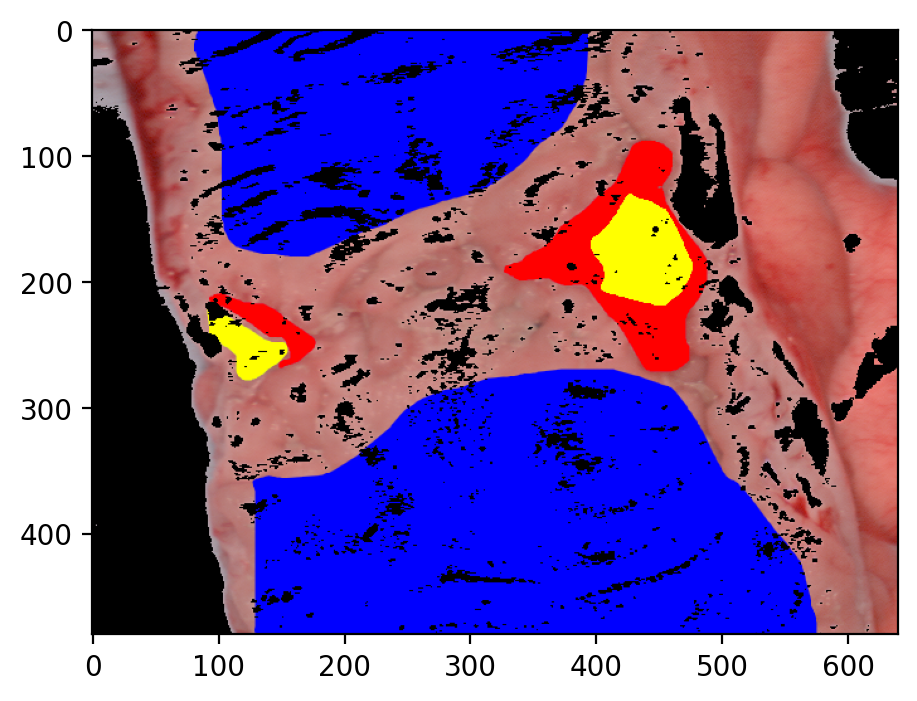

/work/users/mi186veva/data/2020_05_28_15_20_27_SpecCube.dat
(480, 640, 92)
(480, 640)
res.shape (307200,)
res.shape (480, 640)
(18927,) (288273,)


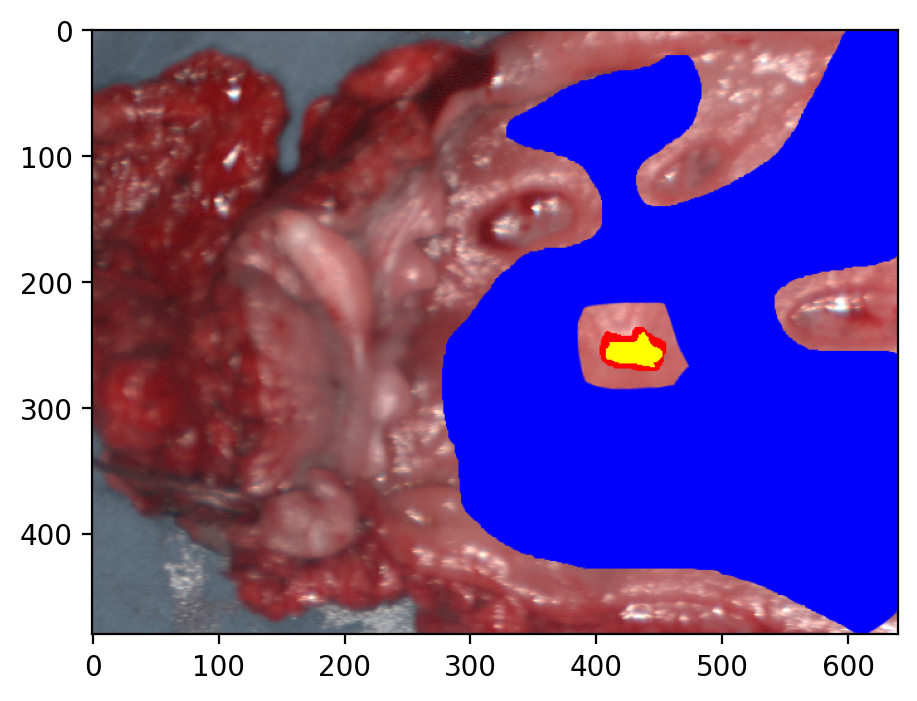

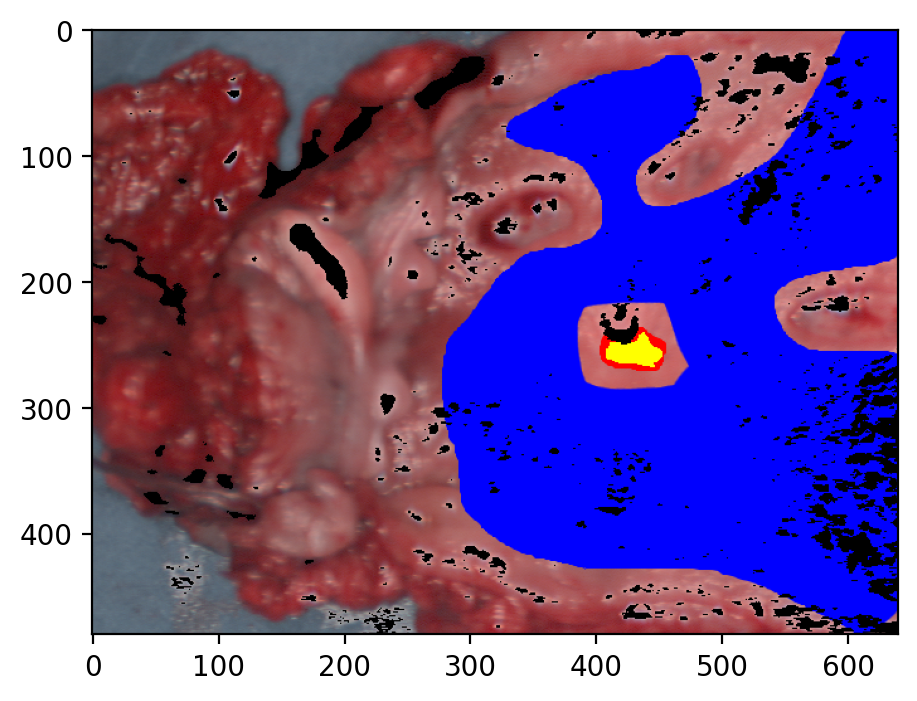

/work/users/mi186veva/data/2019_07_12_11_15_49_SpecCube.dat
(480, 640, 92)
(480, 640)
res.shape (307200,)
res.shape (480, 640)
(22831,) (284369,)


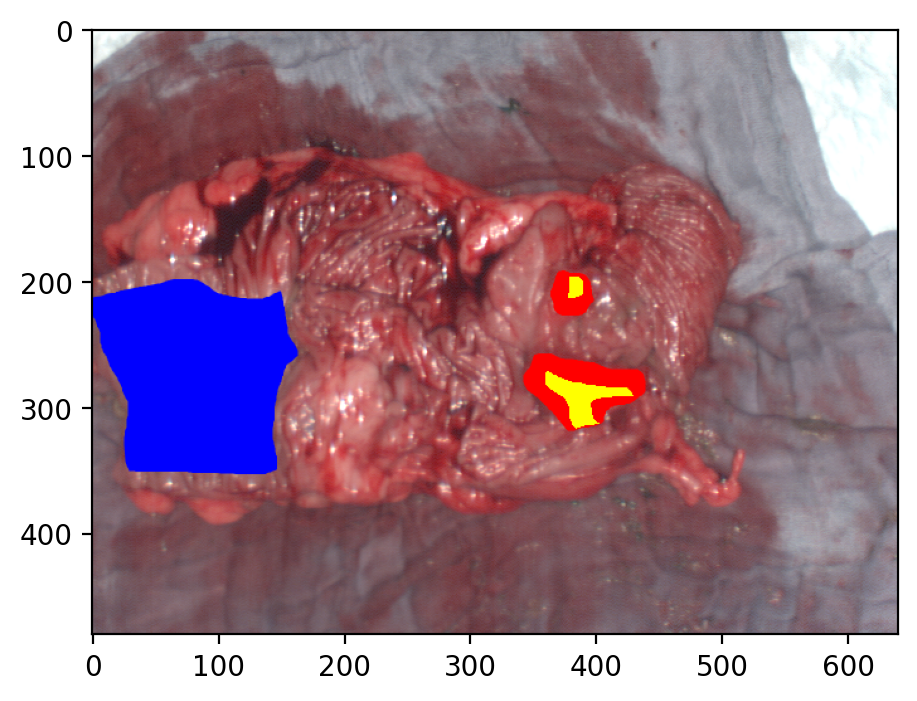

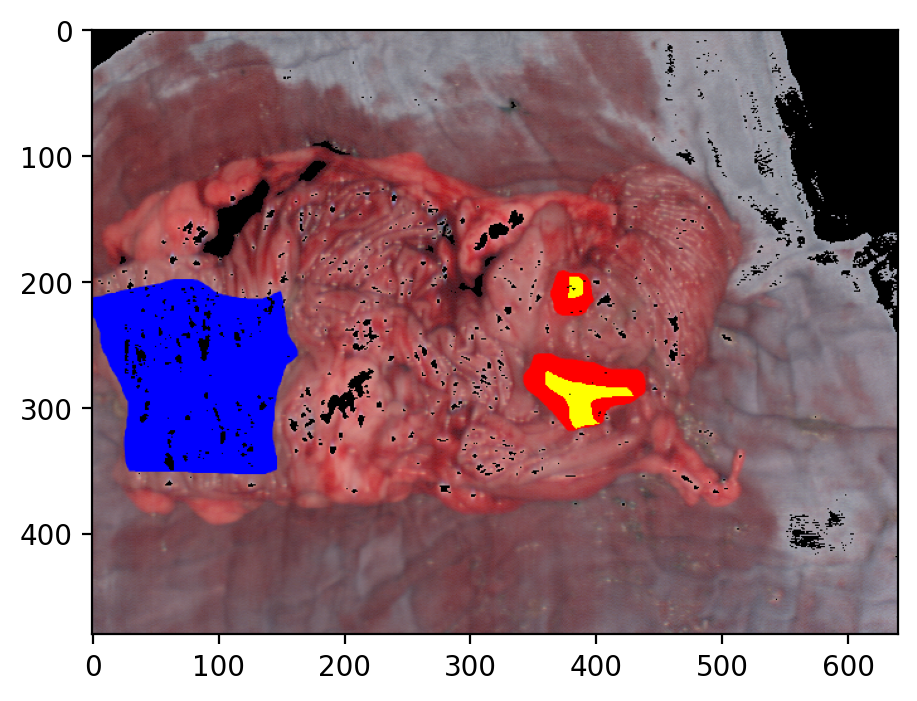

/work/users/mi186veva/data/2020_05_15_12_43_58_SpecCube.dat
(480, 640, 92)
(480, 640)
res.shape (307200,)
res.shape (480, 640)
(3637,) (303563,)


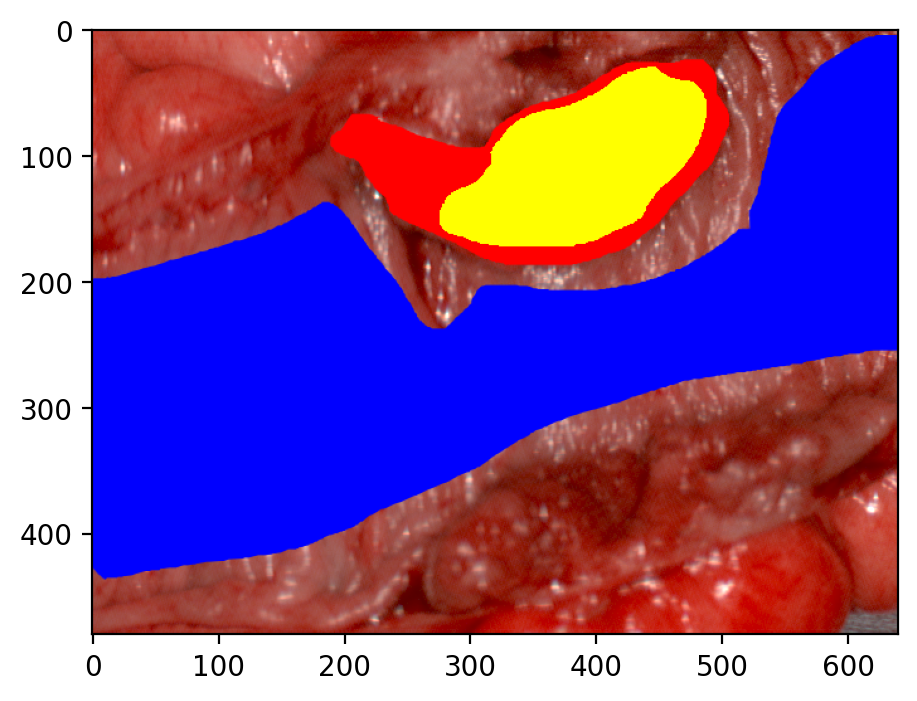

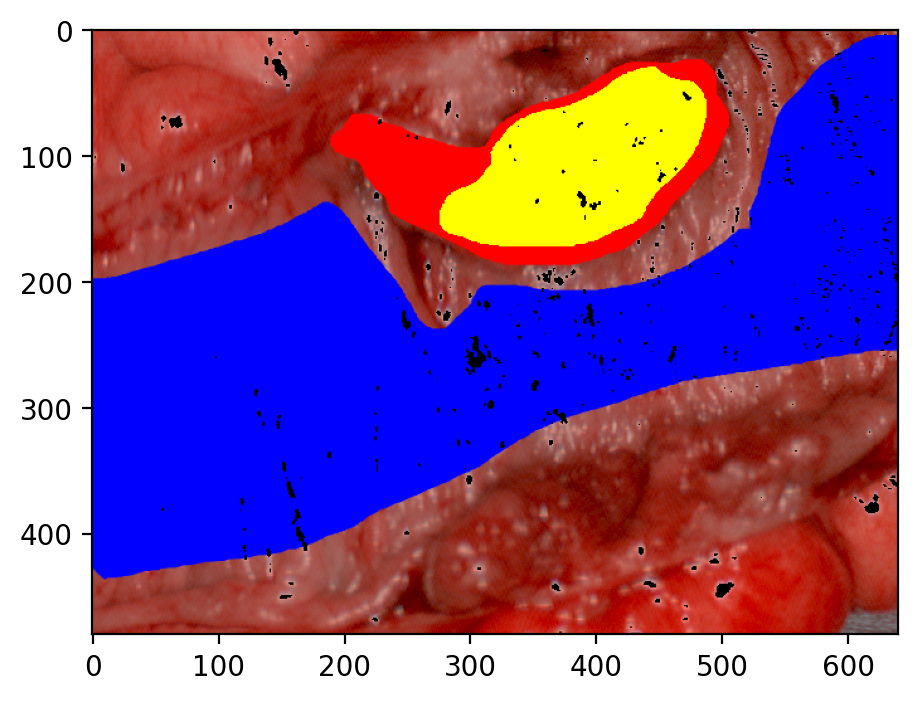

/work/users/mi186veva/data/2020_05_13_19_30_26_SpecCube.dat
(480, 640, 92)
(480, 640)
res.shape (307200,)
res.shape (480, 640)
(13391,) (293809,)


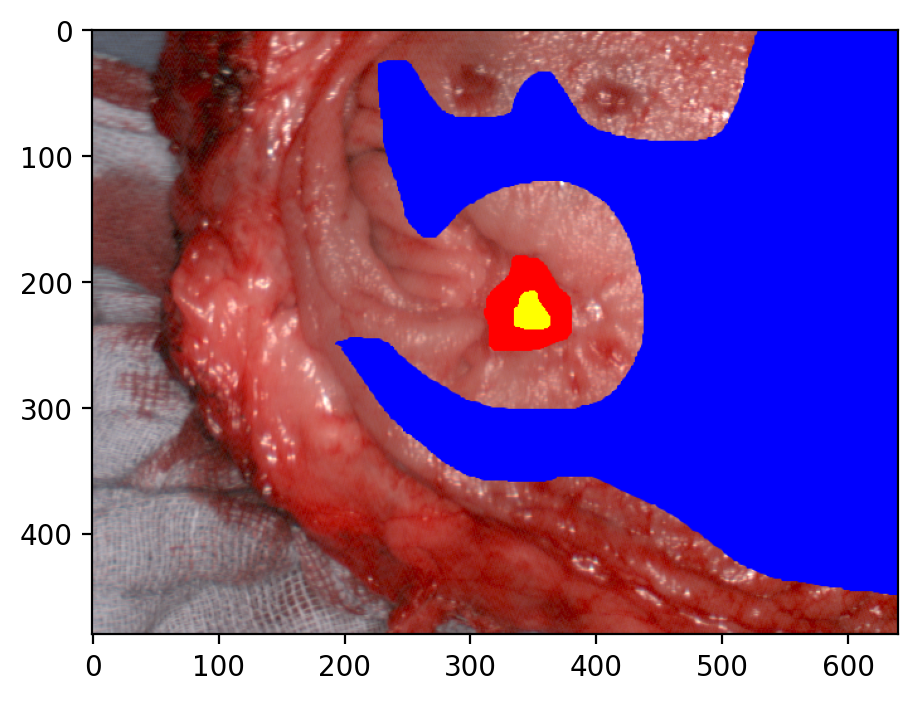

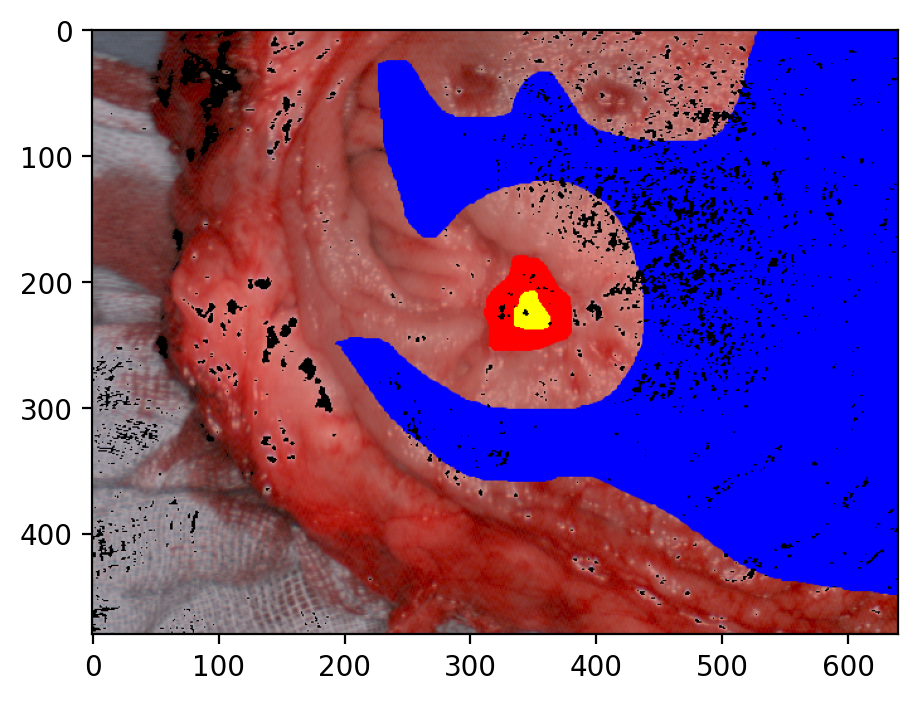

/work/users/mi186veva/data/2019_12_20_15_15_21_SpecCube.dat
(480, 640, 92)
(480, 640)
res.shape (307200,)
res.shape (480, 640)
(34768,) (272432,)


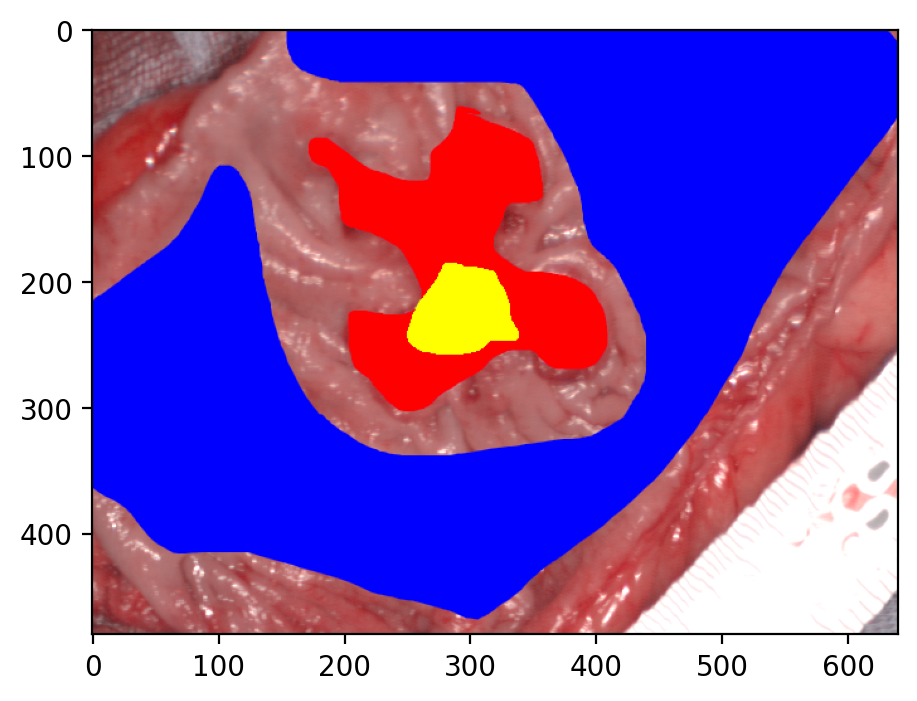

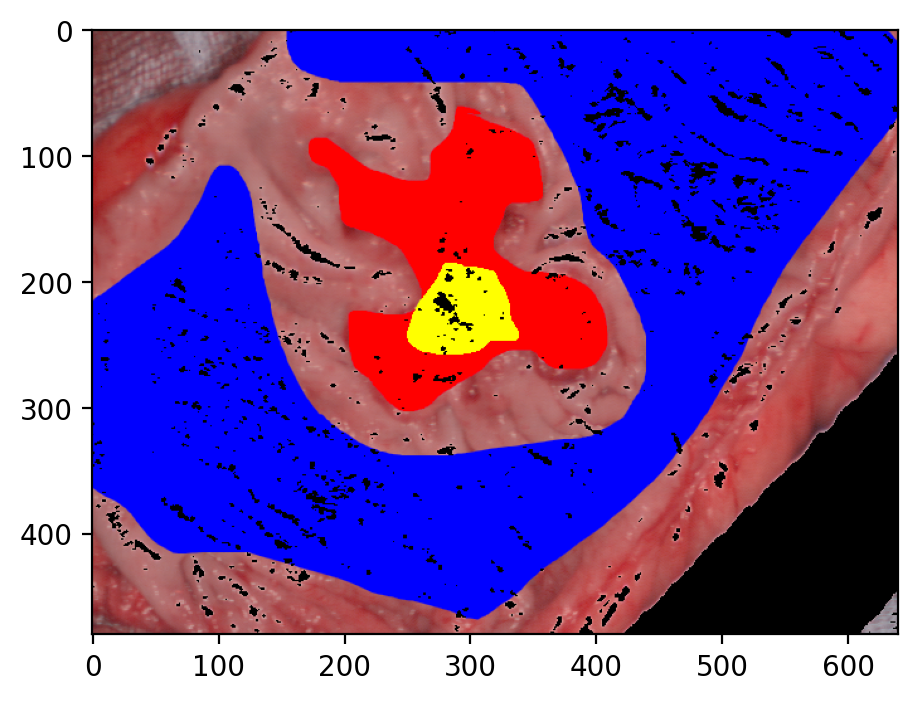

/work/users/mi186veva/data/2019_12_09_14_32_17_SpecCube.dat
(480, 640, 92)
(480, 640)
res.shape (307200,)
res.shape (480, 640)
(6635,) (300565,)


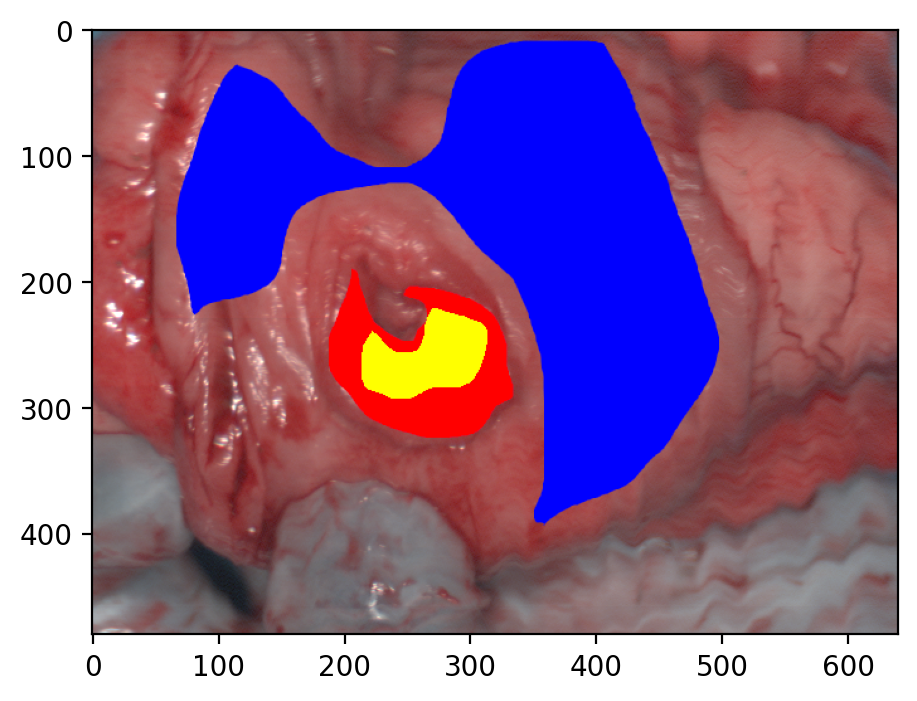

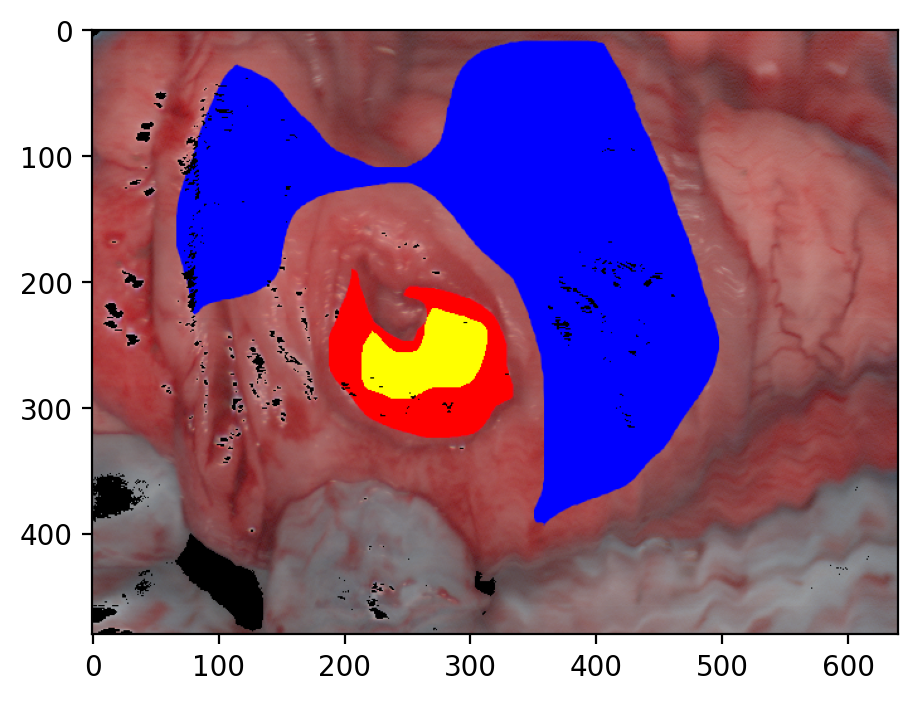

/work/users/mi186veva/data/2020_06_17_14_29_15_SpecCube.dat
(480, 640, 92)
(480, 640)
res.shape (307200,)
res.shape (480, 640)
(77000,) (230200,)


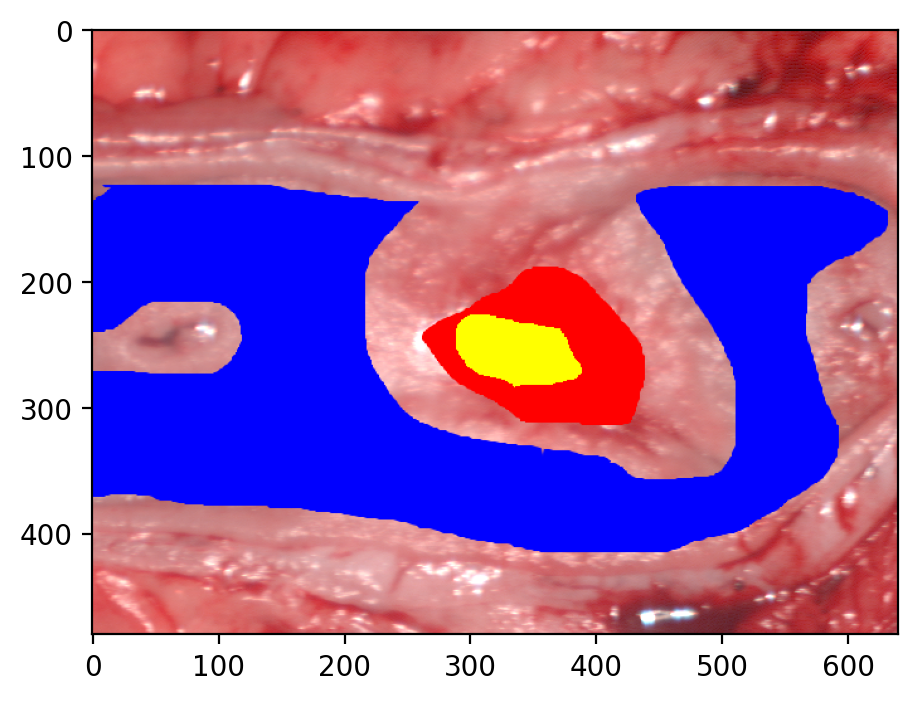

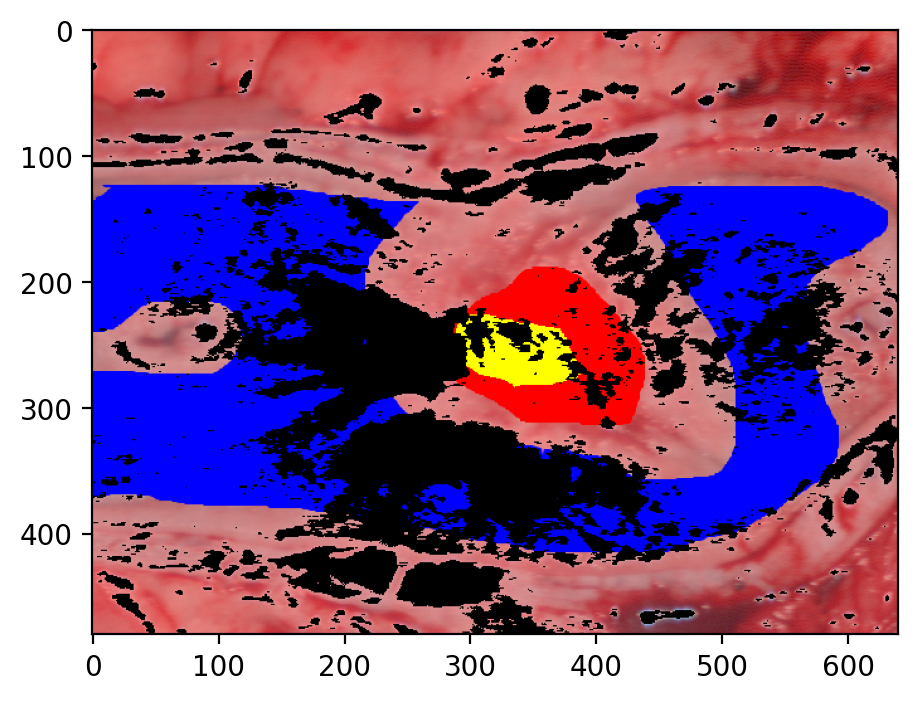

/work/users/mi186veva/data/2020_04_01_14_23_24_SpecCube.dat
(480, 640, 92)
(480, 640)
res.shape (307200,)
res.shape (480, 640)
(98370,) (208830,)


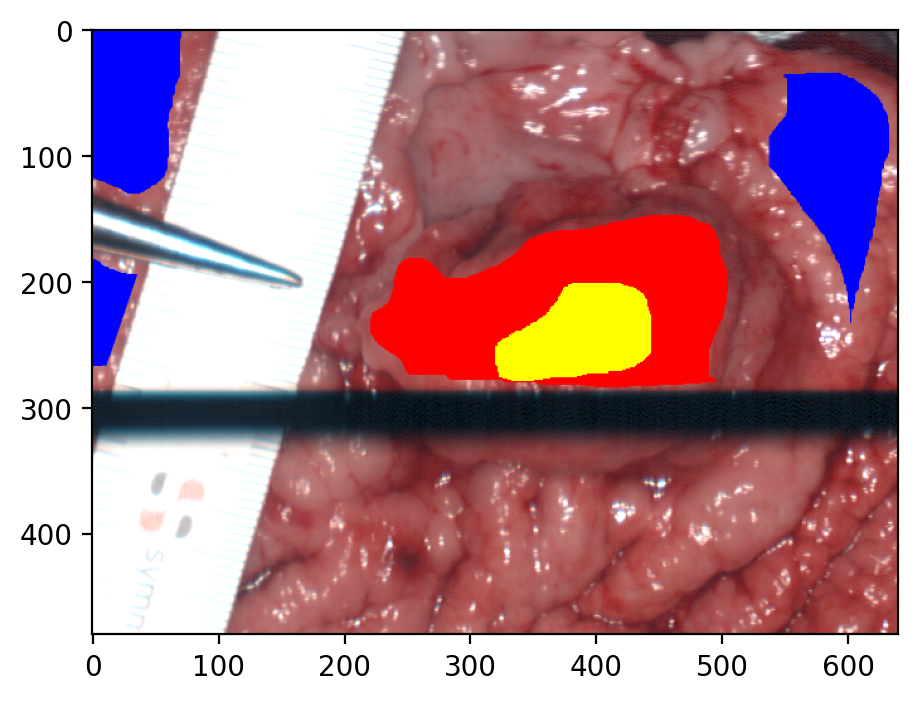

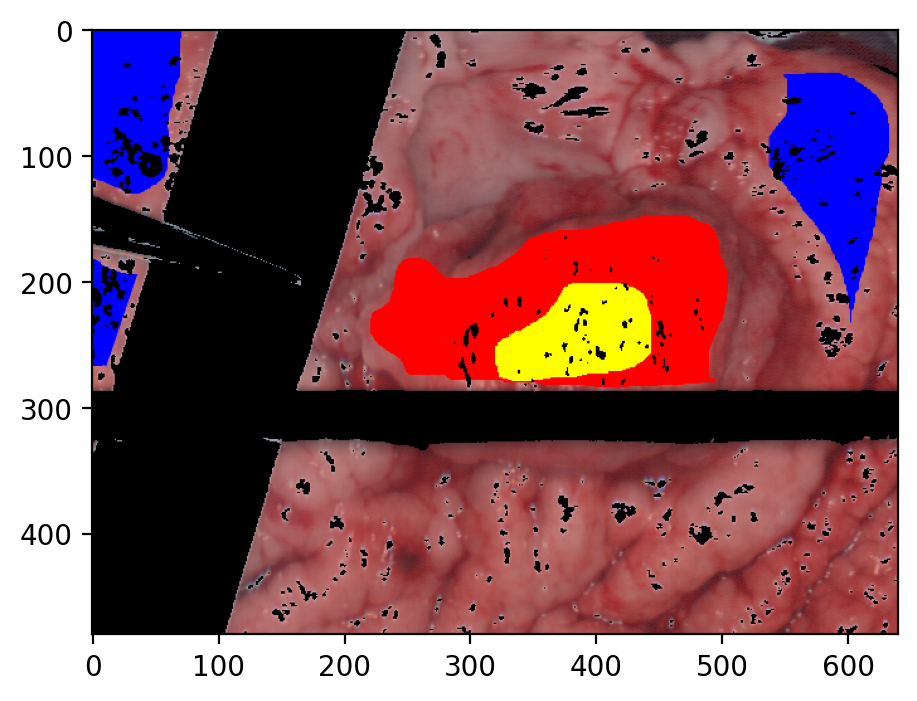

In [5]:
for path in paths[:10]:
    print(path)
    #if '2019_07_17_15_38_14_SpecCube.dat' in path:
    image_path = path + '_Mask JW Kolo.png'
    mask = cv2.imread(image_path)[..., ::-1]

    cube, _ = Cube_Read(path, wavearea=config.WAVE_AREA, Firstnm=8, Lastnm=config.LAST_NM).cube_matrix()
    print(cube.shape)


    #gesund_indexes = np.where((mask[:, :, 0] == 0) & (mask[:, :, 1] == 0) & (mask[:, :, 2] == 255)) #blue
    #not_certain_indexes = np.where((mask[:, :, 0] == 255) & (mask[:, :, 1] == 0) & (mask[:, :, 2] == 0)) #red
    #ill_indexes = np.where((mask[:, :, 0] == 255) & (mask[:, :, 1] == 255) & (mask[:, :, 2] == 0)) #yellow

    gesund_indexes = (mask[:, :, 0] == 0) & (mask[:, :, 1] == 0) & (mask[:, :, 2] == 255) #blue
    not_certain_indexes = (mask[:, :, 0] == 255) & (mask[:, :, 1] == 0) & (mask[:, :, 2] == 0) #red
    ill_indexes = (mask[:, :, 0] == 255) & (mask[:, :, 1] == 255) & (mask[:, :, 2] == 0) #yellow

    print(gesund_indexes.shape)

    #cube = cube[gesund_indexes]
    #print(cube.shape)

    cube = np.reshape(np.array(cube), (640*480, cube.shape[2]))

    res = detect_background(cube)#, minWL=500 + config.FIRST_NM * 5, maxWL=500 + config.LAST_NM * 5, WLsteps=5, cube_index=None, bg_mask=None, scanning='horizontal')
    print('res.shape', res.shape)
    res = np.reshape(res, (480, 640))
    print('res.shape', res.shape)
    print(res[res == 0].shape, res[res == 1].shape)

    plt.figure(dpi=200)
    plt.imshow(mask)
    #plt.savefig('vortrag/with_background.png')
    plt.show()

    res_ = np.expand_dims(res, axis=-1)
    res_3d = np.concatenate([res_, res_, res_], axis=-1)
    #plt.imshow(res_, cmap='gray')
    #plt.show()

    #mask[gesund_indexes] *= res_3d

    mask_ = mask * res_3d
    plt.figure(dpi=200)
    plt.imshow(mask_)
    #plt.savefig('vortrag/without_background.png')
    plt.show()


In [39]:
'''Function for an adding of bg_mask to the existing arrays'''

paths = glob.glob('/work/users/mi186veva/data_preprocessed/raw/*.npz')

for p in paths:
    print(p)
    data = np.load(p)
    X = data['X']
    #print(X.shape)
    bg_mask = detect_background(X).astype(np.bool)
    #print(np.unique(bg_mask))
    
    data = {n: a for n, a in data.items()}
    data['bg_mask'] = bg_mask
    
    np.savez(p, **{n: a for n, a in data.items()})
    
    data = np.load(p)
    #for key, value in data.items() :
    #    print (key)

/work/users/mi186veva/data_preprocessed/raw/2020_06_10_16_35_27_.npz
/work/users/mi186veva/data_preprocessed/raw/2020_06_23_19_23_37_.npz
/work/users/mi186veva/data_preprocessed/raw/2020_01_02_14_26_54_.npz
/work/users/mi186veva/data_preprocessed/raw/2019_09_04_12_43_40_.npz
/work/users/mi186veva/data_preprocessed/raw/2020_01_08_14_04_45_.npz
/work/users/mi186veva/data_preprocessed/raw/2019_07_12_11_15_49_.npz
/work/users/mi186veva/data_preprocessed/raw/2020_06_03_13_33_43_.npz
/work/users/mi186veva/data_preprocessed/raw/2019_12_09_14_32_17_.npz
/work/users/mi186veva/data_preprocessed/raw/2020_03_27_11_31_09_.npz
/work/users/mi186veva/data_preprocessed/raw/2019_07_25_11_56_38_.npz
/work/users/mi186veva/data_preprocessed/raw/2020_02_19_13_03_01_.npz
/work/users/mi186veva/data_preprocessed/raw/2020_05_15_12_43_58_.npz
/work/users/mi186veva/data_preprocessed/raw/2020_05_13_19_30_26_.npz
/work/users/mi186veva/data_preprocessed/raw/2020_05_07_12_52_25_.npz
/work/users/mi186veva/data_preproc

In [29]:
paths = glob.glob('/work/users/mi186veva/data_preprocessed/combi_with_raw_ill/shuffled/*.npz')

for p in paths:
    print(p)
    data = np.load(p)
    print(data['X'].shape[0])

/work/users/mi186veva/data_preprocessed/combi_with_raw_ill/shuffled/shuffled7.npz
82549
/work/users/mi186veva/data_preprocessed/combi_with_raw_ill/shuffled/shuffled0.npz
82309
/work/users/mi186veva/data_preprocessed/combi_with_raw_ill/shuffled/shuffled73.npz
82837
/work/users/mi186veva/data_preprocessed/combi_with_raw_ill/shuffled/shuffled74.npz
82546
/work/users/mi186veva/data_preprocessed/combi_with_raw_ill/shuffled/shuffled9.npz
83069
/work/users/mi186veva/data_preprocessed/combi_with_raw_ill/shuffled/shuffled90.npz
82566
/work/users/mi186veva/data_preprocessed/combi_with_raw_ill/shuffled/shuffled41.npz
82479
/work/users/mi186veva/data_preprocessed/combi_with_raw_ill/shuffled/shuffled97.npz
82701
/work/users/mi186veva/data_preprocessed/combi_with_raw_ill/shuffled/shuffled46.npz
82512
/work/users/mi186veva/data_preprocessed/combi_with_raw_ill/shuffled/shuffled34.npz
83146
/work/users/mi186veva/data_preprocessed/combi_with_raw_ill/shuffled/shuffled99.npz
82730
/work/users/mi186veva/da